In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision.transforms import ToTensor
from PIL import Image
import io

In [2]:
import os
from torchvision.io.image import read_image
from torchvision.utils import draw_bounding_boxes
from torchvision.transforms.functional import to_pil_image
from PIL import ImageFont, ImageDraw
from IPython.display import display
import regex as re
from torchvision.utils import make_grid
import torchvision


# Importing the Models and their respective weights
from torchvision.models.detection import (
    # Faster R-CNN
    fasterrcnn_resnet50_fpn_v2,
    FasterRCNN_ResNet50_FPN_V2_Weights,)

In [3]:
parent = os.getcwd()
parent

'/Users/aisaiahpellecer/Desktop/lclabs-jfp24/early_work/efficient_sam'

In [4]:
# !git clone https://github.com/yformer/EfficientSAM.git
os.chdir("EfficientSAM")

In [5]:
from efficient_sam.build_efficient_sam import build_efficient_sam_vitt, build_efficient_sam_vits
import zipfile

efficient_sam_vitt_model = build_efficient_sam_vitt()
efficient_sam_vitt_model.eval()

# Since EfficientSAM-S checkpoint file is >100MB, we store the zip file.
with zipfile.ZipFile("weights/efficient_sam_vits.pt.zip", 'r') as zip_ref:
    zip_ref.extractall("weights")
efficient_sam_vits_model = build_efficient_sam_vits()
efficient_sam_vits_model.eval()

EfficientSam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=384, out_features=1152, bias=True)
          (proj): Linear(in_features=384, out_features=384, bias=True)
        )
        (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=384, out_features=1536, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=1536, out_features=384, bias=True)
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(384, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d()
    

In [6]:
os.chdir(parent)
os.getcwd()

'/Users/aisaiahpellecer/Desktop/lclabs-jfp24/early_work/efficient_sam'

In [7]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.8])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(
        pos_points[:, 0],
        pos_points[:, 1],
        color="green",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0],
        neg_points[:, 1],
        color="red",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(
        plt.Rectangle((x0, y0), w, h, edgecolor="yellow", facecolor=(0, 0, 0, 0), lw=5)
    )

def show_anns_ours(mask, ax):
    ax.set_autoscale_on(False)
    img = np.ones((mask.shape[0], mask.shape[1], 4))
    img[:, :, 3] = 0
    color_mask = [0, 1, 0, 0.6]
    img[np.logical_not(mask)] = color_mask
    ax.imshow(img)

In [8]:

def run_ours_box_or_points(img_path, pts_sampled, pts_labels, model):
    image_np = np.array(Image.open(img_path))
    img_tensor = ToTensor()(image_np)
    pts_sampled = torch.reshape(torch.tensor(pts_sampled), [1, 1, -1, 2])
    pts_labels = torch.reshape(torch.tensor(pts_labels), [1, 1, -1])
    predicted_logits, predicted_iou = model(
        img_tensor[None, ...],
        pts_sampled,
        pts_labels,
    )

    sorted_ids = torch.argsort(predicted_iou, dim=-1, descending=True)
    predicted_iou = torch.take_along_dim(predicted_iou, sorted_ids, dim=2)
    predicted_logits = torch.take_along_dim(
        predicted_logits, sorted_ids[..., None, None], dim=2
    )

    return torch.ge(predicted_logits[0, 0, 0, :, :], 0).cpu().detach().numpy()

In [9]:
weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn_v2(weights=weights, box_score_thresh=0.9)
model.eval()
# Step 2: Initialize the inference transforms
preprocess = weights.transforms()


In [10]:
os.chdir('../')

(-0.5, 811.5, 1023.5, -0.5)

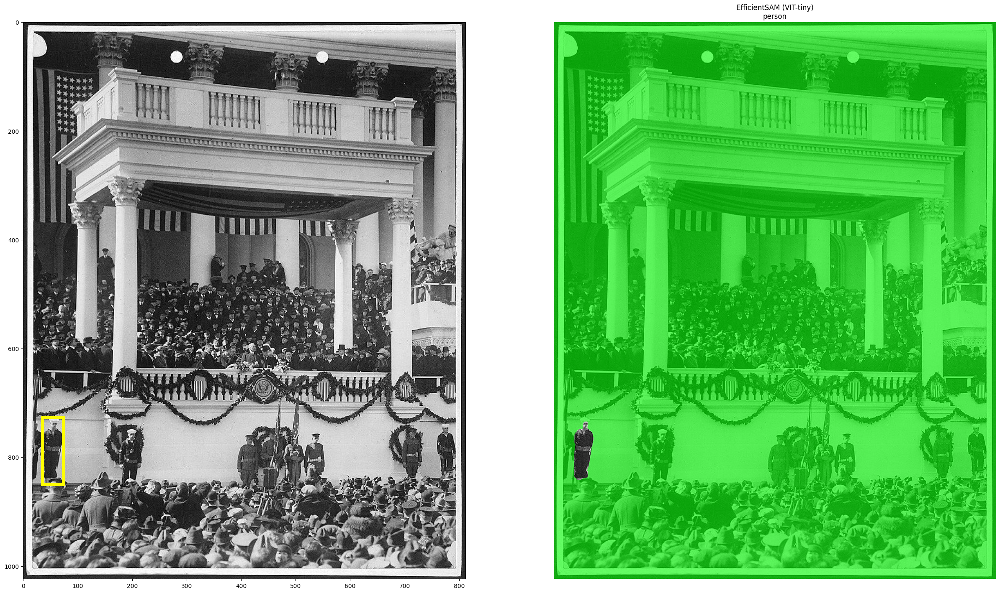

In [11]:
path_img = '../early_work/images/image_00650965.jpg'

img = read_image(path_img)

batch = [preprocess(img)]

# Step 4: Use the model and visualize the prediction
prediction = model(batch)[0]
# labels = [weights.meta["categories"][i] for i in prediction["labels"]]
# box = draw_bounding_boxes(
#     img, boxes=prediction["boxes"], labels=labels, colors="red", width=4, font_size=30
# )
# im = to_pil_image(box.detach())

x1=prediction['boxes'][0][0].item() 
y1=prediction['boxes'][0][1].item()
x2=prediction['boxes'][0][2].item() 
y2=prediction['boxes'][0][3].item() 
w=x2-x1
h=y2-y1

fig, ax = plt.subplots(1, 2, figsize=(30, 30))
input_point = np.array([[x1, y1], [x2, y2]])
input_label = np.array([2,3])
image_path = path_img
image = np.array(Image.open(image_path))
show_points(input_point, input_label, ax[0])
show_box([x1,y1,x2,y2], ax[0])
ax[0].imshow(image)

ax[1].imshow(image)
mask_efficient_sam_vitt = run_ours_box_or_points(image_path, input_point, input_label, efficient_sam_vitt_model)
show_anns_ours(mask_efficient_sam_vitt, ax[1])
ax[1].title.set_text(f"EfficientSAM (VIT-tiny)\n{weights.meta['categories'][prediction['labels'][0].item()]}")
ax[1].axis('off')

In [12]:
binary_mask = mask_efficient_sam_vitt

<!-- path = '/Users/aisaiahpellecer/Downloads/test_item:afc1981004.073:.jpeg'

img = read_image(path)

batch = [preprocess(img)]

# Step 4: Use the model and visualize the prediction
prediction = model(batch)[0]
# labels = [weights.meta["categories"][i] for i in prediction["labels"]]
# box = draw_bounding_boxes(
#     img, boxes=prediction["boxes"], labels=labels, colors="red", width=4, font_size=30
# )
# im = to_pil_image(box.detach())

x1=prediction['boxes'][0][0].item() 
y1=prediction['boxes'][0][1].item()
x2=prediction['boxes'][0][2].item() 
y2=prediction['boxes'][0][3].item() 
w=x2-x1
h=y2-y1

fig, ax = plt.subplots(1, 2, figsize=(30, 30))
input_point = np.array([[x1, y1], [x2, y2]])
input_label = np.array([2,3])
image_path = path
image = np.array(Image.open(image_path))
show_points(input_point, input_label, ax[0])
show_box([x1,y1,x2,y2], ax[0])
ax[0].imshow(image)

ax[1].imshow(image)
mask_efficient_sam_vitt = run_ours_box_or_points(image_path, input_point, input_label, efficient_sam_vitt_model)
show_anns_ours(mask_efficient_sam_vitt, ax[1])
ax[1].title.set_text(f"EfficientSAM (VIT-tiny)\n{weights.meta['categories'][prediction['labels'][0].item()]}")
ax[1].axis('off') -->

In [13]:
import numpy as np
from scipy.ndimage import binary_dilation, binary_erosion, binary_closing, binary_fill_holes

In [14]:
structuring_element = np.ones((25, 25), dtype=bool)

dilated_mask = binary_dilation(binary_mask, structure=structuring_element)
eroded_mask = binary_erosion(dilated_mask, structure=structuring_element)

(-0.5, 811.5, 1023.5, -0.5)

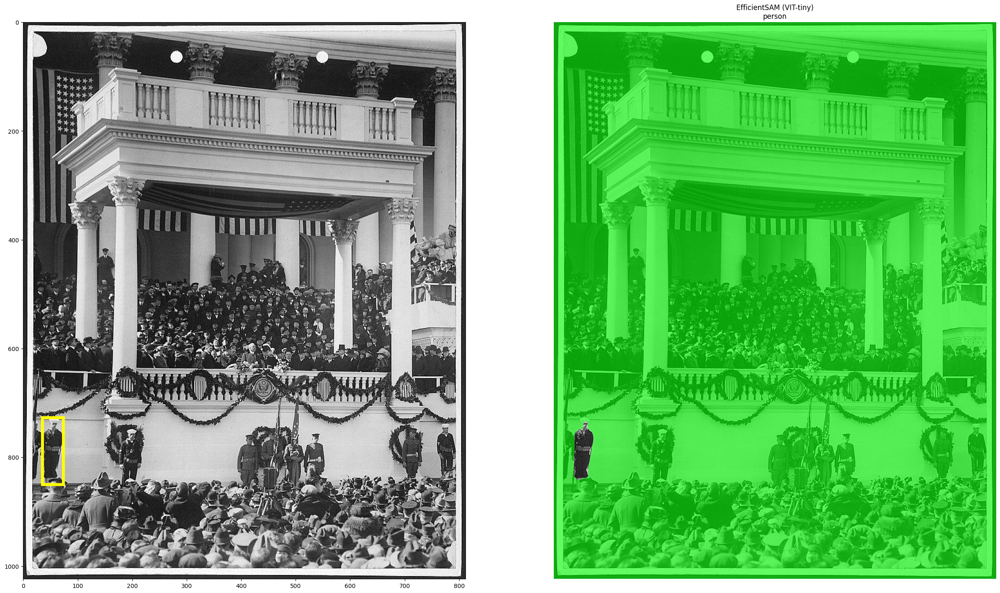

In [15]:
x1=prediction['boxes'][0][0].item() 
y1=prediction['boxes'][0][1].item()
x2=prediction['boxes'][0][2].item() 
y2=prediction['boxes'][0][3].item() 
w=x2-x1
h=y2-y1

fig, ax = plt.subplots(1, 2, figsize=(30, 30))
input_point = np.array([[x1, y1], [x2, y2]])
input_label = np.array([2,3])
image_path = path_img
image = np.array(Image.open(image_path))
show_points(input_point, input_label, ax[0])
show_box([x1,y1,x2,y2], ax[0])
ax[0].imshow(image)

ax[1].imshow(image)



show_anns_ours(eroded_mask, ax[1])
ax[1].title.set_text(f"EfficientSAM (VIT-tiny)\n{weights.meta['categories'][prediction['labels'][0].item()]}")
ax[1].axis('off')

In [16]:
def process_image(path_img, structuring_value=25):
    # Read the image
    img = read_image(path_img)
    batch = [preprocess(img)]
    # Get prediction from the model
    prediction = model(batch)[0]
    
    if len(prediction['labels']) == 0:
        print('No Object Detection predictions within the Scope of MS COCO dataset')

    else:
    # Previously, i had incorporated a way to select the object for extracion
    # dict_items = {}
    # for i in range(len(prediction['labels'])):
    #     dict_items[i] = weights.meta['categories'][prediction['labels'][i].item()]
    #     # print(weights.meta['categories'][prediction['labels'][i].item()] + f':{i}')
    # print(dict_items)
    # print('input item # from dict of interest')
    # x = int(input()) 
    # ignoring the input function and just setting x to 0 to show the top result, if exists.
        name = os.path.basename(path_img).split('.')[0]
        # print('generating mask for first object in: ' + name)
        x = 0
                

        # Extract bounding box coordinates
        x1 = prediction['boxes'][x][0].item()
        y1 = prediction['boxes'][x][1].item()
        x2 = prediction['boxes'][x][2].item()
        y2 = prediction['boxes'][x][3].item()
        w = x2 - x1
        h = y2 - y1
        
        fig, ax = plt.subplots(1, 4, figsize=(24, 16))
        input_point = np.array([[x1, y1], [x2, y2]])
        input_label = np.array([2, 3])
        class_label = weights.meta['categories'][prediction['labels'][x].item()]
        
        image = np.array(Image.open(path_img))
        show_points(input_point, input_label, ax[0])
        show_box([x1, y1, x2, y2], ax[0])
        ax[0].imshow(image)
        ax[0].axis('off')
        ax[0].set_title(f"Original Image &\nFaster R-CNN Bounding Box",fontsize=8)


        ax[1].imshow(image)
        mask_efficient_sam_vitt = run_ours_box_or_points(path_img, input_point, input_label, efficient_sam_vitt_model)
        show_anns_ours(mask_efficient_sam_vitt, ax[1])
        ax[1].set_title(f"EfficientSAM (VIT-tiny)\nOriginal Mask: {class_label}\nStructuring element: {structuring_value}X{structuring_value}",fontsize=8)
        ax[1].axis('off')

        ax[2].imshow(image)
        binary_mask = mask_efficient_sam_vitt
        structuring_element = np.ones((structuring_value,structuring_value), dtype=bool)
        dilated_mask = binary_dilation(binary_mask, structure=structuring_element)
        closing_mask = binary_erosion(dilated_mask, structure=structuring_element)

        show_anns_ours(closing_mask, ax[2])
        ax[2].set_title(f"EfficientSAM (VIT-tiny)\n Closing Mask:{class_label}\nStructuring element: {structuring_value}X{structuring_value}",fontsize=8)
        ax[2].axis('off')

        ax[3].imshow(image)
        expanded_dilated_mask = binary_dilation(binary_mask, structure=np.ones((40,40), dtype=bool))
        show_anns_ours(expanded_dilated_mask, ax[3])
        ax[3].set_title(f"EfficientSAM (VIT-tiny)\nDilated Mask:{class_label}\nStructuring element: 40X40",fontsize=8)
        ax[3].axis('off')

        
        # Show the plot
        # plt.show()
        plt.savefig(f'efficient_sam/outputs/{name}.png', bbox_inches='tight')
        print(f'Mask Evaluation saved to efficient_sam/outputs/{name}.png')

Mask Evaluation saved to efficient_sam/outputs/image_2017454465.png


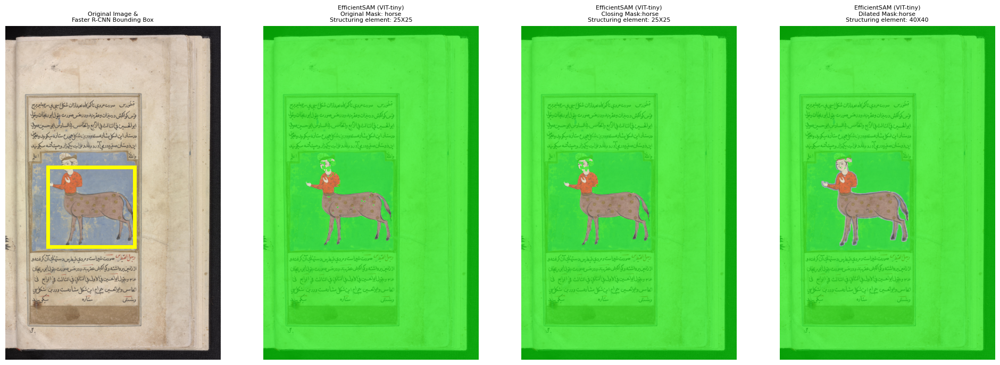

In [17]:
for image in os.listdir('images')[0:1]:
    path = "images/" + image
    # print(path)
    process_image(path)

In [18]:
# for image in os.listdir('images')[20:40]:
#     path = "images/" + image
#     # print(path)
#     process_image(path)

Mask Evaluation saved to efficient_sam/outputs/image_2020721404.png
Mask Evaluation saved to efficient_sam/outputs/image_2020734020.png
Mask Evaluation saved to efficient_sam/outputs/image_00652557.png


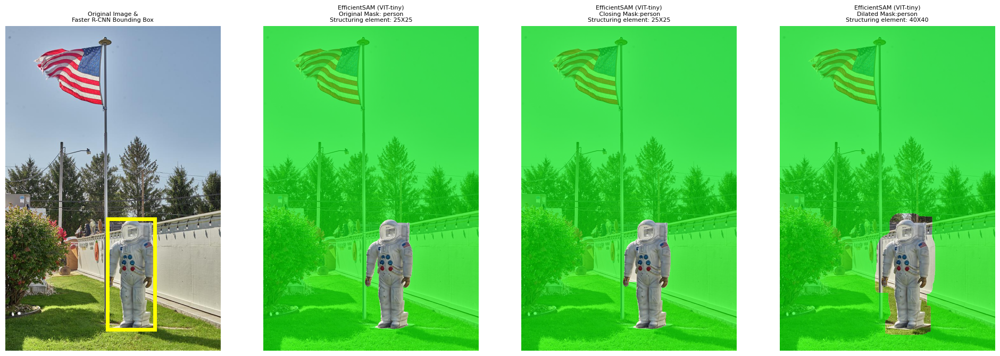

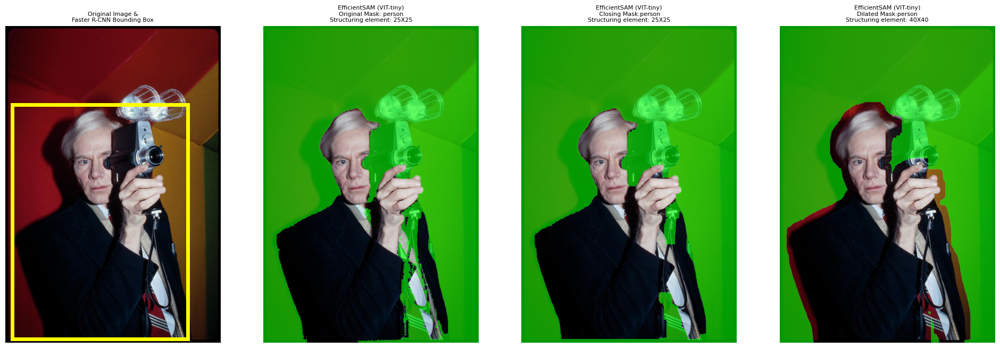

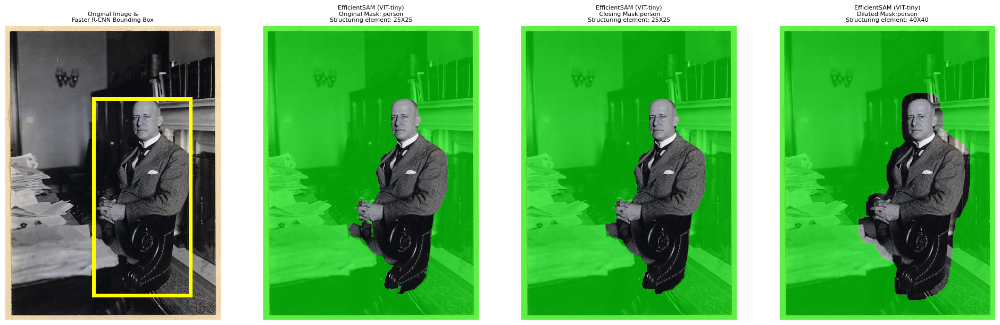

In [19]:
for image in os.listdir('../workflow/image-collection-output/')[:3]:
    path = "../workflow/image-collection-output/" + image
    # print(path)
    process_image(path)

Mask Evaluation saved to efficient_sam/outputs/image_2016887160.png


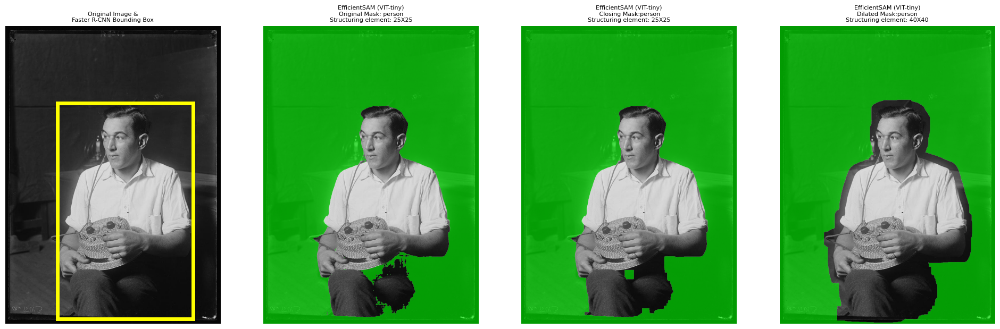

In [30]:
extra_paths = ["images/image_2011633149.jpg",
    "images/image_2016887160.jpg",
    "../workflow/image-collection-output/image_2017879462.jpg",
    "../workflow/image-collection-output/image_2021643419.jpg",
]
process_image("images/image_2016887160.jpg")

Mask Evaluation saved to efficient_sam/outputs/image_2011633149.png


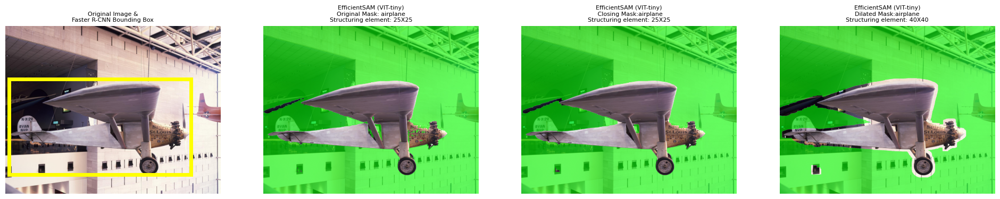

In [33]:
structuring_value=25
# Read the image
path_img = 'images/image_2011633149.jpg'
img = read_image(path_img)
batch = [preprocess(img)]
# Get prediction from the model
prediction = model(batch)[0]

if len(prediction['labels']) == 0:
    print('No Object Detection predictions within the Scope of MS COCO dataset')

else:
# Previously, i had incorporated a way to select the object for extracion
# dict_items = {}
# for i in range(len(prediction['labels'])):
#     dict_items[i] = weights.meta['categories'][prediction['labels'][i].item()]
#     # print(weights.meta['categories'][prediction['labels'][i].item()] + f':{i}')
# print(dict_items)
# print('input item # from dict of interest')
# x = int(input()) 
# ignoring the input function and just setting x to 0 to show the top result, if exists.
    name = os.path.basename(path_img).split('.')[0]
    # print('generating mask for first object in: ' + name)
    x = 1
            

    # Extract bounding box coordinates
    x1 = prediction['boxes'][x][0].item()
    y1 = prediction['boxes'][x][1].item()
    x2 = prediction['boxes'][x][2].item()
    y2 = prediction['boxes'][x][3].item()
    w = x2 - x1
    h = y2 - y1
    
    fig, ax = plt.subplots(1, 4, figsize=(24, 16))
    input_point = np.array([[x1, y1], [x2, y2]])
    input_label = np.array([2, 3])
    class_label = weights.meta['categories'][prediction['labels'][x].item()]
    
    image = np.array(Image.open(path_img))
    show_points(input_point, input_label, ax[0])
    show_box([x1, y1, x2, y2], ax[0])
    ax[0].imshow(image)
    ax[0].axis('off')
    ax[0].set_title(f"Original Image &\nFaster R-CNN Bounding Box",fontsize=8)


    ax[1].imshow(image)
    mask_efficient_sam_vitt = run_ours_box_or_points(path_img, input_point, input_label, efficient_sam_vitt_model)
    show_anns_ours(mask_efficient_sam_vitt, ax[1])
    ax[1].set_title(f"EfficientSAM (VIT-tiny)\nOriginal Mask: {class_label}\nStructuring element: {structuring_value}X{structuring_value}",fontsize=8)
    ax[1].axis('off')

    ax[2].imshow(image)
    binary_mask = mask_efficient_sam_vitt
    structuring_element = np.ones((structuring_value,structuring_value), dtype=bool)
    dilated_mask = binary_dilation(binary_mask, structure=structuring_element)
    closing_mask = binary_erosion(dilated_mask, structure=structuring_element)

    show_anns_ours(closing_mask, ax[2])
    ax[2].set_title(f"EfficientSAM (VIT-tiny)\n Closing Mask:{class_label}\nStructuring element: {structuring_value}X{structuring_value}",fontsize=8)
    ax[2].axis('off')

    ax[3].imshow(image)
    expanded_dilated_mask = binary_dilation(binary_mask, structure=np.ones((40,40), dtype=bool))
    show_anns_ours(expanded_dilated_mask, ax[3])
    ax[3].set_title(f"EfficientSAM (VIT-tiny)\nDilated Mask:{class_label}\nStructuring element: 40X40",fontsize=8)
    ax[3].axis('off')

    
    # Show the plot
    # plt.show()
    plt.savefig(f'efficient_sam/outputs/{name}.png', bbox_inches='tight')
    print(f'Mask Evaluation saved to efficient_sam/outputs/{name}.png')